# IMPORT LIBRARIES 
For analyzing data, we need some libraries. In this section, we are importing all the required libraries like pandas, NumPy, matplotlib, plotly, seaborn, and word cloud that are required for data analysis. Check the below code to import all the required libraries.

In [1]:
import pandas as pd#pandas is a Python package providing fast, flexible, and expressive data structures designed to make working with “relational” or “labeled” data both easy and intuitive.
import matplotlib.pyplot as plt#Matplotlib is a comprehensive library for creating static, animated, and interactive visualizations in Python
import plotly.express as px#The plotly Python library is an interactive, open-source plotting library that supports over 40 unique chart types covering a wide range of statistical, financial, geographic, scientific, and 3-dimensional use-cases
import plotly.graph_objects as go#By importing the graph_objects module, we gain access to all of these chart types and building blocks, allowing us to create custom, interactive data visualizations in Python using the Plotly library.
from wordcloud import WordCloud#Wordcloud is basically a visualization technique to represent the frequency of words in a text where the size of the word represents its frequency

# READ DATA AND BASIC INFORMATION 
Read the CSV file using pandas read_csv() function and show the output using head() function.

In [2]:
covid_df=pd.read_excel('owid-covid-data .xlsx')

In [3]:
covid_df

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258049,ZWE,Africa,Zimbabwe,2023-02-12,263083.0,0.0,108.429,5659.0,0.0,0.143,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
258050,ZWE,Africa,Zimbabwe,2023-02-13,263083.0,0.0,108.429,5659.0,0.0,0.143,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
258051,ZWE,Africa,Zimbabwe,2023-02-14,263083.0,0.0,108.429,5659.0,0.0,0.143,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
258052,ZWE,Africa,Zimbabwe,2023-02-15,263642.0,559.0,79.857,5662.0,3.0,0.429,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN


# Observation:
Dataset has columns like new_cases_smoothed,total_deaths,.....,male_smokers etc. An initial look at the above table shows that data has null values too. We will deal with null values later.

In [4]:
covid_df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

# info() function
It is used to get the overview of data like data type of feature, a number of null values in each column, and many more.
LET'S UNDERSTAND THE DATASET

In [5]:
covid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 258054 entries, 0 to 258053
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    258054 non-null  object 
 1   continent                                   243574 non-null  object 
 2   location                                    258054 non-null  object 
 3   date                                        258054 non-null  object 
 4   total_cases                                 243486 non-null  float64
 5   new_cases                                   243205 non-null  float64
 6   new_cases_smoothed                          242001 non-null  float64
 7   total_deaths                                223825 non-null  float64
 8   new_deaths                                  223732 non-null  float64
 9   new_deaths_smoothed                         222546 non-null  float64
 

# Observation:

The above picture shows that there are many null values in our dataset. We will deal with these null values later. There are two data types as seen from the table object means string and float.

The below function is used to get the total count of null values in each feature.

In [6]:
covid_df.isnull().sum()

iso_code                                        0
continent                                   14480
location                                        0
date                                            0
total_cases                                 14568
                                            ...  
population                                   1106
excess_mortality_cumulative_absolute       249523
excess_mortality_cumulative                249523
excess_mortality                           249523
excess_mortality_cumulative_per_million    249523
Length: 67, dtype: int64

# DATA CLEANING 
Dataset has many null values as we have seen before. To get rid of it we need to clean the data first, After cleaning we will perform our further analysis. For cleaning the dataset we will Handle and Fill the null values. 

In [7]:
covid_df.fillna(value = 0,inplace=True)
covid_df

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,0.000,0.0,0.0,0.000,...,0.0,37.746,0.5,64.83,0.511,41128772.0,0.0,0.0,0.0,0.0
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,0.000,0.0,0.0,0.000,...,0.0,37.746,0.5,64.83,0.511,41128772.0,0.0,0.0,0.0,0.0
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,0.000,0.0,0.0,0.000,...,0.0,37.746,0.5,64.83,0.511,41128772.0,0.0,0.0,0.0,0.0
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,0.000,0.0,0.0,0.000,...,0.0,37.746,0.5,64.83,0.511,41128772.0,0.0,0.0,0.0,0.0
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,0.000,0.0,0.0,0.000,...,0.0,37.746,0.5,64.83,0.511,41128772.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258049,ZWE,Africa,Zimbabwe,2023-02-12,263083.0,0.0,108.429,5659.0,0.0,0.143,...,30.7,36.791,1.7,61.49,0.571,16320539.0,0.0,0.0,0.0,0.0
258050,ZWE,Africa,Zimbabwe,2023-02-13,263083.0,0.0,108.429,5659.0,0.0,0.143,...,30.7,36.791,1.7,61.49,0.571,16320539.0,0.0,0.0,0.0,0.0
258051,ZWE,Africa,Zimbabwe,2023-02-14,263083.0,0.0,108.429,5659.0,0.0,0.143,...,30.7,36.791,1.7,61.49,0.571,16320539.0,0.0,0.0,0.0,0.0
258052,ZWE,Africa,Zimbabwe,2023-02-15,263642.0,559.0,79.857,5662.0,3.0,0.429,...,30.7,36.791,1.7,61.49,0.571,16320539.0,0.0,0.0,0.0,0.0


In [8]:
covid_df.isnull().sum()

iso_code                                   0
continent                                  0
location                                   0
date                                       0
total_cases                                0
                                          ..
population                                 0
excess_mortality_cumulative_absolute       0
excess_mortality_cumulative                0
excess_mortality                           0
excess_mortality_cumulative_per_million    0
Length: 67, dtype: int64

In [9]:
covid_df.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
258049    False
258050    False
258051    False
258052    False
258053    False
Length: 258054, dtype: bool

# SOME FEATURES 
Let’s get some details about our features using the below code

In [10]:
covid_df

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,0.000,0.0,0.0,0.000,...,0.0,37.746,0.5,64.83,0.511,41128772.0,0.0,0.0,0.0,0.0
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,0.000,0.0,0.0,0.000,...,0.0,37.746,0.5,64.83,0.511,41128772.0,0.0,0.0,0.0,0.0
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,0.000,0.0,0.0,0.000,...,0.0,37.746,0.5,64.83,0.511,41128772.0,0.0,0.0,0.0,0.0
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,0.000,0.0,0.0,0.000,...,0.0,37.746,0.5,64.83,0.511,41128772.0,0.0,0.0,0.0,0.0
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,0.000,0.0,0.0,0.000,...,0.0,37.746,0.5,64.83,0.511,41128772.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258049,ZWE,Africa,Zimbabwe,2023-02-12,263083.0,0.0,108.429,5659.0,0.0,0.143,...,30.7,36.791,1.7,61.49,0.571,16320539.0,0.0,0.0,0.0,0.0
258050,ZWE,Africa,Zimbabwe,2023-02-13,263083.0,0.0,108.429,5659.0,0.0,0.143,...,30.7,36.791,1.7,61.49,0.571,16320539.0,0.0,0.0,0.0,0.0
258051,ZWE,Africa,Zimbabwe,2023-02-14,263083.0,0.0,108.429,5659.0,0.0,0.143,...,30.7,36.791,1.7,61.49,0.571,16320539.0,0.0,0.0,0.0,0.0
258052,ZWE,Africa,Zimbabwe,2023-02-15,263642.0,559.0,79.857,5662.0,3.0,0.429,...,30.7,36.791,1.7,61.49,0.571,16320539.0,0.0,0.0,0.0,0.0


In [11]:
print('Data point starts from ',covid_df.date.min())
print('Data point ends at ',covid_df.date.max())
print('Total Number of Countries in the data set',covid_df.location.nunique())

Data point starts from  2020-01-01
Data point ends at  2023-02-16
Total Number of Countries in the data set 248


# Observation
Data points start from 2020-01-01

Data points end at 2023-02-16

Total Number of Countries in the data set = 248

In [12]:
covid_df.location.unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Asia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao',
       'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'England', 'Equatorial Guinea', 'Eritrea',
       'Estonia', 'Eswat

# describe() 
it is a function in pandas used to get the statistics of each feature present in our dataset. Some of the information we get include count, max, min, standard deviation, median, etc.

In [13]:
covid_df.describe()

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
count,2.580540e+05,2.580540e+05,2.580540e+05,2.580540e+05,258054.000000,258054.000000,258054.000000,258054.000000,258054.000000,258054.000000,...,258054.000000,258054.000000,258054.000000,258054.000000,258054.000000,2.580540e+05,2.580540e+05,258054.000000,258054.000000,258054.000000
mean,4.979364e+06,1.112899e+04,1.111762e+04,6.919373e+04,110.454978,110.355590,68921.623979,167.162399,166.800846,649.044567,...,19.723257,20.194092,2.214530,67.546706,0.569115,1.398954e+08,1.708228e+03,0.340957,0.466600,49.278511
std,3.155612e+07,7.979639e+04,7.738922e+04,3.795417e+05,688.663795,636.944156,121380.513009,1093.856322,646.723705,989.642482,...,19.195877,32.001508,2.570597,21.437278,0.325603,6.901612e+08,2.720291e+04,3.032614,5.330037,426.559078
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,-3.772610e+04,-28.450000,-95.920000,-1984.281600
25%,3.064000e+03,0.000000e+00,1.857000e+00,3.000000e+01,0.000000,0.000000,819.431500,0.000000,0.366000,10.311250,...,0.000000,0.000000,0.000000,66.320000,0.456000,8.367830e+05,0.000000e+00,0.000000,0.000000,0.000000
50%,4.527550e+04,2.400000e+01,5.528600e+01,6.780000e+02,0.000000,0.429000,10052.938500,2.893000,11.315000,141.784500,...,18.800000,0.000000,1.500000,74.160000,0.703000,6.871547e+06,0.000000e+00,0.000000,0.000000,0.000000
75%,5.489702e+05,6.920000e+02,8.494290e+02,8.048750e+03,7.000000,9.143000,80353.608000,72.316000,108.088000,956.769500,...,35.400000,34.808000,3.280000,78.800000,0.813000,3.369661e+07,0.000000e+00,0.000000,0.000000,0.000000
max,6.735706e+08,4.082891e+06,3.436562e+06,6.860165e+06,60900.000000,14860.286000,720435.220000,228872.025000,36421.827000,6440.753000,...,78.100000,100.000000,13.800000,86.750000,0.957000,7.975105e+09,1.253111e+06,76.550000,376.770000,10112.677000


In [14]:
date=covid_df.date.str.split('-',expand=True)
date

,0,1,2
0,2020,02,24
1,2020,02,25
2,2020,02,26
3,2020,02,27
4,2020,02,28
...,...,...,...
258049,2023,02,12
258050,2023,02,13
258051,2023,02,14
258052,2023,02,15


In [15]:
covid_df['year']=date[0]
covid_df['month']=date[1]
covid_df['day']=date[2]
covid_df.year=pd.to_numeric(covid_df.year)
covid_df.month=pd.to_numeric(covid_df.month)
covid_df.day=pd.to_numeric(covid_df.day)

In [39]:
covid_df.drop(index=covid_df[covid_df['continent']=='0'].index,inplace=True)
#covid_df

The above code is to delete the rows where continent is not present.Now the dataset looks fine now we can analyze it by ploting the graphs

#  Word Art of Countries
Word Cloud is a unique way to get information from our dataset. The words are shown in the form of art where the size proportional depends on how much the particular word repeated in the dataset. This is made by using the WordCloud library. Check the below code on how to draw word cloud

In [40]:
covid_df['continent']=covid_df['continent'].astype(str)

In [41]:
' '.join(covid_df.location.unique())

"Afghanistan Albania Algeria Andorra Angola Anguilla Antigua and Barbuda Argentina Armenia Aruba Australia Austria Azerbaijan Bahamas Bahrain Bangladesh Barbados Belarus Belgium Belize Benin Bermuda Bhutan Bolivia Bonaire Sint Eustatius and Saba Bosnia and Herzegovina Botswana Brazil British Virgin Islands Brunei Bulgaria Burkina Faso Burundi Cambodia Cameroon Canada Cape Verde Cayman Islands Central African Republic Chad Chile China Colombia Comoros Congo Cook Islands Costa Rica Cote d'Ivoire Croatia Cuba Curacao Cyprus Czechia Democratic Republic of Congo Denmark Djibouti Dominica Dominican Republic Ecuador Egypt El Salvador England Equatorial Guinea Eritrea Estonia Eswatini Ethiopia Faeroe Islands Falkland Islands Fiji Finland France French Polynesia Gabon Gambia Georgia Germany Ghana Gibraltar Greece Greenland Grenada Guam Guatemala Guernsey Guinea Guinea-Bissau Guyana Haiti Honduras Hong Kong Hungary Iceland India Indonesia Iran Iraq Ireland Isle of Man Israel Italy Jamaica Japan 

In [42]:
' '.join(covid_df.continent.unique())

'Asia Europe Africa North America South America Oceania'

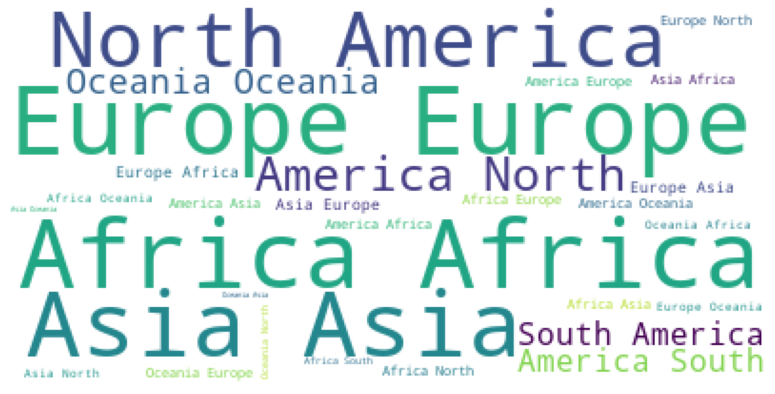

In [43]:
wordCloud = WordCloud(
    background_color='white',
    max_font_size = 50).generate(' '.join(covid_df.continent))
plt.figure(figsize=(15,7))
plt.axis('off')
plt.imshow(wordCloud)
plt.show()

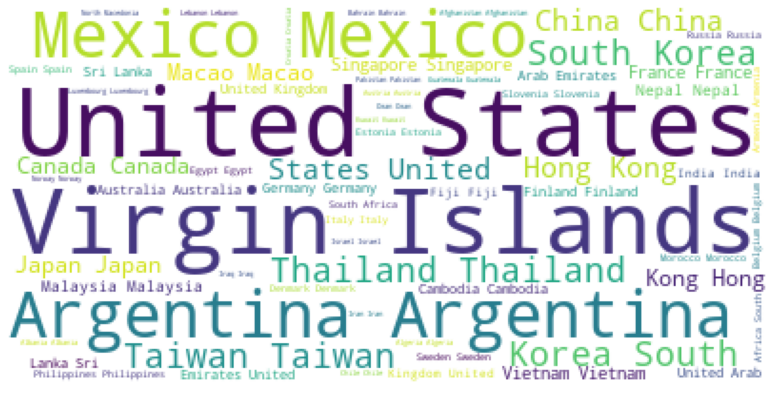

In [44]:
wordCloud = WordCloud(
    background_color='white',
    max_font_size = 50).generate(' '.join(covid_df.location))
plt.figure(figsize=(15,7))
plt.axis('off')
plt.imshow(wordCloud)
plt.show()

# Country Wise Total cases 
To check what is the total cases in each country, check the below code. We are drawing the line plot where the x-axis is the date and the y-axis is the count of daily cases, Colours Is set to be the country.

In [45]:
compare = covid_df.groupby('location')[['new_vaccinations', 'total_vaccinations','people_vaccinated', 'people_fully_vaccinated','population','total_cases','total_boosters_per_hundred','total_boosters','date']].max().sort_values(['total_vaccinations'], ascending=False).reset_index()
compare=pd.DataFrame(compare)
compare

,location,new_vaccinations,total_vaccinations,people_vaccinated,people_fully_vaccinated,population,total_cases,total_boosters_per_hundred,total_boosters,date
0,China,24741000.0,3.491077e+09,1.310292e+09,1.276760e+09,1.425887e+09,2023904.0,57.99,826913000.0,2023-02-16
1,India,18627269.0,2.206293e+09,1.027364e+09,9.518565e+08,1.417173e+09,44685884.0,16.02,227072456.0,2023-02-16
2,United States,4571614.0,6.703065e+08,2.692087e+08,2.298203e+08,3.382899e+08,103071815.0,39.96,132668559.0,2023-02-16
3,Brazil,3976605.0,4.844428e+08,1.891706e+08,1.757219e+08,2.153135e+08,36971440.0,58.20,125306304.0,2023-02-16
4,Indonesia,2952259.0,4.443031e+08,2.036575e+08,1.726933e+08,2.755013e+08,6733697.0,24.66,67952274.0,2023-02-16
...,...,...,...,...,...,...,...,...,...,...
230,Northern Mariana Islands,0.0,0.000000e+00,0.000000e+00,0.000000e+00,4.957400e+04,0.0,0.00,0.0,2021-12-04
231,United States Virgin Islands,0.0,0.000000e+00,0.000000e+00,0.000000e+00,9.947900e+04,0.0,0.00,0.0,2022-06-19
232,Eritrea,0.0,0.000000e+00,0.000000e+00,0.000000e+00,3.684041e+06,10189.0,0.00,0.0,2023-02-16
233,Micronesia (country),0.0,0.000000e+00,0.000000e+00,0.000000e+00,1.141780e+05,23671.0,0.00,0.0,2023-02-16


In [46]:
fig = px.line(covid_df, x = 'date', y ='total_cases', color = 'location')
fig.update_layout(
    title={
            'text' : "Country wise Daily Cases"
        },
    xaxis_title="Date",
    yaxis_title="Daily Cases",
    template='plotly_dark'
)
fig.show() #displays figure

# Observation:

Recently USA has high no of cases on December 20 followed by india and,china has least no of cases etc..,
Now Lets see Vaccination count on top 20 countries.

# Let's Deal with Top 20 countries

# Top 20 Countries in view of Total Vaccinations

In [47]:
fig = px.bar(compare[0:20], x='location', y='total_vaccinations', color='location')
fig.update_layout(template='plotly_dark')
# Alternative way for doing background dark
# fig.update_layout(plot_bgcolor = "black")
fig.update_layout(title="Top 20 Countries in view of Total Vaccinations",
                 xaxis_title= "Country Name",
                 yaxis_title= "Total vaccinations")
fig.show()

# Observation
The above graph clearly says that China is much far away than the other countries, India is progressing slowly according to its population while USA has achieved as much as it is a rich country thus we can say that china has highest vaccination count compared to india and usa.We can conclude that china has least no of cases just because of highest vaccination count.

# Comparision between people_fully_vaccinated and people_vaccinated

In [96]:
fig = go.Figure(data=[
    go.Bar(x=compare[0:20].location, y=compare[0:20].people_fully_vaccinated, marker_color='Lime green', name='people_fully_vaccinated'),
    go.Bar(x=compare[0:20].location, y=compare[0:20].people_vaccinated, marker_color='#7DF9FF', name='people_vaccinated')
])
fig.update_layout(barmode='group')
fig.update_layout(template='plotly_dark')
fig.update_layout(title="A comparitive Bar Chart between 'people_vaccinated' and 'people_full_vaccinated'",
                 xaxis_title= "Country Name",
                 yaxis_title= "Population")
fig.show()

# Observation
For china,India and USA has litle difference in both people fully vaccinated and people vaccinated graphs,There is a less difference in  completely immunized people and partially immunized people in the above graph's countries.

# A comparitive Bar Chart between 'people_vaccinated', 'people_fully_vaccinated' and 'Population'

In [49]:
fig = go.Figure(data=[
    go.Bar(x=compare[0:20].location, y=compare[0:20].people_fully_vaccinated, marker_color='yellow', name='people_fully_vaccinated'),
    go.Bar(x=compare[0:20].location, y=compare[0:20].people_vaccinated, marker_color='red', name='people_vaccinated'),
    go.Bar(x=compare[0:20].location, y=compare[0:20].population, marker_color='blue', name='population')
])
fig.update_layout(barmode='group')
fig.update_layout(template='plotly_dark')
fig.update_layout(title="A comparitive Bar Chart between 'people_vaccinated', 'people_full_vaccinated' and 'Population'",
                 xaxis_title= "Country Name",
                 yaxis_title= "Population")
fig.show()

# Observation
India is far way to cover it’s total population with complete immunization, while USA,China has done a nice job for the vaccination and japan,vietnam,mexico etc has covered above 50% population with complete immunization.

# Relation between Total boosters and Total boosters per Hundred: 

In [101]:
fig = px.scatter(compare[0:20],x = 'total_boosters',y='total_boosters_per_hundred',
                 size='total_boosters',
                 hover_name = 'location',size_max = 50,
                 title="Total vs Total boosters per hundred ",
                color='location')
fig.update_layout(template='plotly_dark')
fig.show()

# Observation
China is providing a highest no of booster doses when compared to USA and India,however we can observe that USA is bit backward in providing the boosters compared to Japan

# Daily new vaccinations in each country

In [53]:
top_10 = list(compare.sort_values('population', ascending=False)['location'].head(10))
print(top_10)

['China', 'India', 'United States', 'Indonesia', 'Pakistan', 'Nigeria', 'Brazil', 'Bangladesh', 'Russia', 'Mexico']


In [120]:
fig = go.Figure(go.Scatter(x=compare.date,y=compare.new_vaccinations,visible=True,mode='lines'))


buttons = []
for x in top_10:
    buttons.append(dict(method='restyle',
                        label=x,
                        visible=True,
                        args=[{'x':[covid_df[covid_df['location']== x].date],
                               'y':[covid_df[covid_df['location']== x].new_vaccinations],
                               'type':'scatter'}, [0]],
                       )
                  )
updatemenu = []
your_menu = dict()
updatemenu.append(your_menu)

updatemenu[0]['buttons'] = buttons
updatemenu[0]['direction'] = 'down'
# add dropdown menus to the figure
fig.update_layout(showlegend=False, updatemenus=updatemenu)
fig.update_layout(template="plotly_dark")
fig.update_layout(title="Daily new vaccination graph for top 10 most populous countries")
fig.show()

# Vaccine Schemes used Across the Countries

In [57]:
vaccine_df=pd.read_excel('country_vaccinations.xlsx')
#vaccine_df

In [ ]:
fig1 = px.choropleth(vaccine_df, locations = 'country',locationmode = 'country names', color = 'vaccines',
                   title = 'Vaccination by Country', height = 1000)
fig1.update_layout({'legend_orientation':'h'})
fig.update_layout(template='plotly_dark')
fig1.update_layout({'legend_title':'Vaccine scheme'})
fig1.show()

#  How's the vaccine distribution according the Manufacturers data?

In [58]:
cm=pd.read_excel('country_vaccinations_by_manufacturer.xlsx')
#cm.location.nunique()
cm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35623 entries, 0 to 35622
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   location            35623 non-null  object        
 1   date                35623 non-null  datetime64[ns]
 2   vaccine             35623 non-null  object        
 3   total_vaccinations  35623 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 1.1+ MB


In [130]:
fig = go.Figure([go.Pie(labels=cm.vaccine, values=cm.total_vaccinations)])
fig.update_layout(template="presentation")
fig.update_layout(template='plotly_dark')
fig.update_layout(title='Vaccine Distribution Over 43 countries')
fig.show()

# Top 3 Frequently used Vaccination Schemes in the World


In [137]:
colors=['#fae588','#f79d65','#f9dc5c','#e8ac65','#e76f51','#ef233c','#b7094c'] #color palette
vaccinetotalpop = vaccine_df.groupby(["country", "vaccines"])['total_vaccinations'].max().nlargest(3).reset_index()
fig = px.treemap(vaccinetotalpop, path = ['country','vaccines' ], values = 'total_vaccinations',
                title="Total vaccinations per country grouped by vaccine scheme",  height = 800 , width = 1000 )
fig.update_layout( font_family = "Courier New", font_color = "white", treemapcolorway = colors,template='plotly_dark')
fig.show()

C:\Users\lenovo\Documents\Downloads\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\lenovo\Documents\Downloads\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



# Observation
China’s Cansino, Sinopharm and Sinovac vaccination schemes are most frequently used followed by India’s Covaxin, Oxford/Astra Zeneca and SputnikV and United States Johnson, Moderna and Pfizer.

# Most Used Vaccine

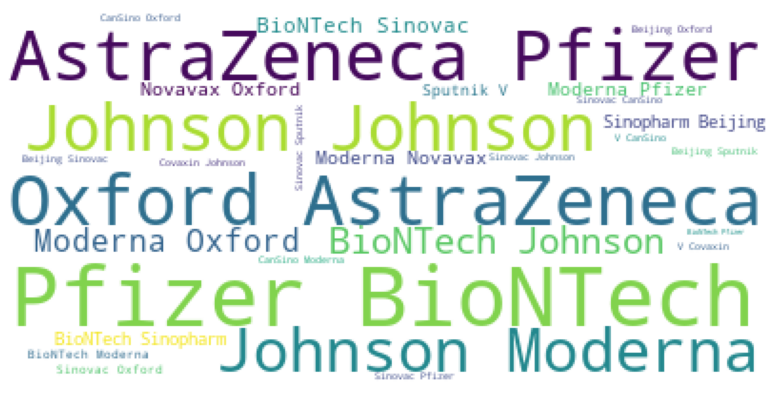

In [84]:
wordCloud = WordCloud(
    background_color='white',
    max_font_size = 50).generate(' '.join(cm.vaccine))
plt.figure(figsize=(15,7))
plt.axis('off')
plt.imshow(wordCloud)
plt.show()

In [85]:
import numpy as np

In [86]:
compare['percentage']=np.around(np.multiply(np.divide(np.array(compare['people_vaccinated']),
                                                        np.array(compare['population'])), 100), decimals=2)
compare['percentage_fully_vacci']=np.around(np.multiply(np.divide(np.array(compare['people_fully_vaccinated']),
                                                        np.array(compare['population'])), 100), decimals=2)
compare['percentage_total_vacci']=np.around(np.multiply(np.divide(np.array(compare['total_vaccinations']),
                                                        np.array(compare['population'])), 100), decimals=2)
compare

,location,new_vaccinations,total_vaccinations,people_vaccinated,people_fully_vaccinated,population,total_cases,total_boosters_per_hundred,total_boosters,date,total_vaccinated_pct,percentage,percentage_fully_vacci,percentage_total_vacci
0,China,24741000.0,3.491077e+09,1.310292e+09,1.276760e+09,1.425887e+09,2023904.0,57.99,826913000.0,2023-02-16,244.835398,91.89,89.54,244.84
1,India,18627269.0,2.206293e+09,1.027364e+09,9.518565e+08,1.417173e+09,44685884.0,16.02,227072456.0,2023-02-16,155.682695,72.49,67.17,155.68
2,United States,4571614.0,6.703065e+08,2.692087e+08,2.298203e+08,3.382899e+08,103071815.0,39.96,132668559.0,2023-02-16,198.145612,79.58,67.94,198.15
3,Brazil,3976605.0,4.844428e+08,1.891706e+08,1.757219e+08,2.153135e+08,36971440.0,58.20,125306304.0,2023-02-16,224.994175,87.86,81.61,224.99
4,Indonesia,2952259.0,4.443031e+08,2.036575e+08,1.726933e+08,2.755013e+08,6733697.0,24.66,67952274.0,2023-02-16,161.270767,73.92,62.68,161.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230,Northern Mariana Islands,0.0,0.000000e+00,0.000000e+00,0.000000e+00,4.957400e+04,0.0,0.00,0.0,2021-12-04,0.000000,0.00,0.00,0.00
231,United States Virgin Islands,0.0,0.000000e+00,0.000000e+00,0.000000e+00,9.947900e+04,0.0,0.00,0.0,2022-06-19,0.000000,0.00,0.00,0.00
232,Eritrea,0.0,0.000000e+00,0.000000e+00,0.000000e+00,3.684041e+06,10189.0,0.00,0.0,2023-02-16,0.000000,0.00,0.00,0.00
233,Micronesia (country),0.0,0.000000e+00,0.000000e+00,0.000000e+00,1.141780e+05,23671.0,0.00,0.0,2023-02-16,0.000000,0.00,0.00,0.00


# How much percentage share of population by dose 1 and 2 for top 10 most populous countries?

In [111]:
fig = go.Figure(data=[
    go.Bar(name='fully_vaccinated', x=compare['location'][0:20], y=compare['percentage_fully_vacci'], marker_color='#000000',
           text=compare['percentage_fully_vacci']),
    go.Bar(name='vaccinated', x=compare['location'][0:20], y=compare['percentage'],marker_color='#808080',
          text=compare['percentage'], textposition='outside')
])
fig.update_layout(barmode='stack')
fig.update_layout(template='simple_white')
fig.update_layout(title="Percentage share of 1 does and 2 dose population for top 10 most populous contries",
                 xaxis_title="Country", yaxis_title="Percentage")
fig.show()

# Observation
Out of all these most populous countries, china seems to be in good position as they have achieved 89% of total population with complete immunization, This may be because of they are using vaccine from Casino.And also USA and India has percentage of fully vaccinated people